In [1]:
import numpy as np
import cv2
import time
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

import torch.nn.functional as F

import torch.optim as optim

from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler


import torchvision
from torchvision import transforms
from torchvision import datasets
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image

from torchmetrics import StructuralSimilarityIndexMeasure

from skimage import color

# Loss Function: SSIM
# Activation Function: ReLu

# TODO:
# input: 640 x 480
# output: 1920 x 1440

In [2]:
BATCH_SIZE = 1
LEARNING_RATE = 0.001
NUM_WORKERS = 0
STACK_SIZE = 8

FORWARD_COUNT = 0

INPUT_DIRECTORY = 'Data-Generator/Set1/training_data/'
TRUTH_DIRECTORY =  'Data-Generator/Set1/ground_truth/'

VAL_DIRECTORY = 'Data-Generator/Set2/training_data/'
VAL_TRUTH_DIRECTORY = 'Data-Generator/Set2/ground_truth/'

TEST_DIRECTORY = 'Data-Generator/Set1/training_data/'
TEST_TRUTH_DIRECTORY = 'Data-Generator/Set1/ground_truth/'

INPUT_TENSOR_DIR = 'tensors/Set1/training_data/'
TRUTH_TENSOR_DIR = 'tensors/Set1/ground_truth/'

VAL_TENSOR_DIR = 'tensors/Set2/training_data/'
VAL_TRUTH_TENSOR_DIR = 'tensors/Set2/ground_truth/'

TEST_TENSOR_DIR = 'tensors/Set3/training_data/'
TEST_TRUTH_TENSOR_DIR = 'tensors/Set3/ground_truth/'

# Dataset

In [3]:
def get_data_paths(input_dir, ground_dir, num_frames, offset=0):
    data_paths = []
    i = 0
    while i < num_frames:
        training_paths = []
        ground_paths = []
        for j in range(STACK_SIZE):
            training_paths.append(input_dir + str(offset + i) + '.jpg')
            ground_paths.append(ground_dir + str(offset + i) + '.jpg')
            i += 1
        data_paths.append([training_paths, ground_paths])
    print("data size: ", str(len(data_paths)))
    return data_paths

In [4]:
# read in 8 images and transpose them to be (c, h, w) instead of (h, w, c)
# stack the imagesT
# turn image stack into tensor
# normalize tensor

def make_tensors(data_paths):
    training_paths = data_paths[0]
    ground_paths = data_paths[1]
    training_jpgs = []
    ground_jpgs = []
    
    for i in range(STACK_SIZE):
        training_jpg = plt.imread(training_paths[i])
        ground_jpg = plt.imread(ground_paths[i])
        
        training_jpg = np.transpose(training_jpg, (2,0,1))
        ground_jpg = np.transpose(ground_jpg, (2,0,1))
        
        training_jpgs.append(training_jpg)
        ground_jpgs.append(ground_jpg)
        
    training_stacked = np.stack(training_jpgs, axis=0)
    ground_stacked = np.stack(ground_jpgs, axis=0)
    
    stacked_training_tensor = torch.tensor(training_stacked, dtype=torch.float32)
    stacked_ground_tensor = torch.tensor(ground_stacked, dtype=torch.float32)
    
    stacked_training_tensor = stacked_training_tensor / 255.0
    stacked_ground_tensor = stacked_ground_tensor / 255.0
    
    return stacked_training_tensor, stacked_ground_tensor
        

In [25]:
def generate_dataset(data_dir, truth_dir, data_paths):
    tensor_paths = []
    for i in range(len(data_paths)):
        tt, gt = make_tensors(data_paths[i])
        
        save_path_training = data_dir + str(i) + '.pt'
        save_path_truth = truth_dir + str(i) + '.pt'
        
        torch.save(tt, save_path_training)
        torch.save(gt, save_path_truth)
        
        tensor_paths.append([save_path_training, save_path_truth])
    return tensor_paths

In [6]:
# get_tensors for when tensors are saved
def get_tensors(data_paths):
    training = torch.load(data_paths[0])
    ground = torch.load(data_paths[1])
    return training, ground

# get_tensors for when tensors are NOT saved
# def get_tensors(data_paths):
#     return make_tensors(data_paths)

In [7]:
class VHSDataSet(Dataset):
    def __init__(self, data_paths, transform=None):
        self.data_paths = data_paths
        self.transform = transform

    def __len__(self):
        return len(self.data_paths)

    def __getitem__(self, idx):
        stacked_frames_tensor, ground_truth_tensor = get_tensors(self.data_paths[idx])
        return stacked_frames_tensor, ground_truth_tensor

# Model

In [60]:
class VHSResNet(nn.Module):
    def __init__(self, block, layers, num_classes=1000):
        super(VHSResNet, self).__init__()
        self.in_channels = 64

        # 3D Convolutional layers for processing stacked frames
        self.conv3d_1 = nn.Conv3d(8, 8, kernel_size=(1,3,3), stride=2, padding=1, bias=False)
        self.bn1 = nn.BatchNorm3d(8)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(block, 8, 8, layers[0])
        self.layer2 = self._make_layer(block, 8, 8, layers[1])
        self.layer3 = self._make_layer(block, 8, 8, layers[2])
        
        self.upscale2 = nn.ConvTranspose3d(8, 8, kernel_size=(1,4,4), stride=2, padding=1, bias=False)
        
        self.layer4 = self._make_layer(block, 8, 8, layers[3])
        self.layer5 = self._make_layer(block, 8, 8, layers[4])
        
        self.upscale3 = nn.ConvTranspose3d(8, 8, kernel_size=(1,7,7), stride=3, padding=2, bias=False)
        self.bn2 = nn.BatchNorm3d(8)
        self.relu2 = nn.ReLU(inplace=True)
        
        self.layer6 = self._make_layer(block, 8, 8, layers[5])
        self.layer7 = self._make_layer(block, 8, 8, layers[6])
        self.layer8 = self._make_layer(block, 8, 8, layers[7])
        
        self.output_layer = nn.BatchNorm3d(8)

    def _make_layer(self, block, in_channels, out_channels, blocks, stride=1):
        downsample = None
        layers = []
        layers.append(block(in_channels, out_channels, stride))
        self.in_channels = out_channels * block.expansion
        for _ in range(1, blocks):
            layers.append(block(in_channels, out_channels))
        return nn.Sequential(*layers)

    def forward(self, x):
        # Input x is a 5D tensor with dimensions (batch_size, temporal_size, channels, height, width)
#         batch_size, channels, height, width = x.size()
#         print(x.size())
#         print('x', x.size())

        x = self.conv3d_1(x)
        x = self.bn1(x)
        x = self.relu(x)
#         print('finished first conv block', x.size())
        
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
#         print('finished first resl block', x.size())
        
        x = self.upscale2(x)
#         print('finished first upsl block', x.size())
        
        x = self.layer4(x)
        x = self.layer5(x)
#         print('finished secnd resl block', x.size())
        
        x = self.upscale3(x)
        x = self.bn2(x)
#         print('finished secnd upsl block', x.size())
        
        x = self.layer6(x)
        x = self.layer7(x)
        x = self.layer8(x)
#         print('finished third resl block', x.size())
        
#         x = self.output_layer(x)

        return x

In [61]:
class ResidualBlock(nn.Module):
    expansion = 1

    def __init__(self, in_channels, out_channels, stride=1, downsample = None):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv3d(in_channels, out_channels, kernel_size=3, stride=(1,stride,stride), padding=1, bias=False)
        self.bn1 = nn.BatchNorm3d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv3d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm3d(out_channels)
        self.conv3 = nn.Conv3d(in_channels, out_channels, kernel_size=3, stride=(1,stride,stride))
        self.bn3 = nn.BatchNorm3d(out_channels)
        
        self.downsample = downsample

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)
        
        if out.size(dim=1) != residual.size(dim=1):
            residual = self.conv3(residual)
            residual = self.bn3(residual)
#         print("checking  residual  block", out.size(), ", ", residual.size())
        out += residual
        out = self.relu(out)

        return out


# Training

In [62]:
train_data_paths = get_data_paths(INPUT_DIRECTORY, TRUTH_DIRECTORY, 40, 12000)
train_tensors = generate_dataset(INPUT_TENSOR_DIR, TRUTH_TENSOR_DIR, train_data_paths)

val_data_paths = get_data_paths(VAL_DIRECTORY, VAL_TRUTH_DIRECTORY, 16, 3800)
val_tensors = generate_dataset(VAL_TENSOR_DIR, VAL_TRUTH_TENSOR_DIR, val_data_paths)

data size:  5
data size:  2


In [63]:
train_dataset = VHSDataSet(data_paths=train_tensors)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

val_dataset = VHSDataSet(data_paths=val_tensors)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

In [64]:
model = VHSResNet(block=ResidualBlock, layers=[2, 2, 2, 2, 2, 2, 2, 2])
# model.load_state_dict(torch.load('vhs_restoration_model.pth'))
ssim_loss = StructuralSimilarityIndexMeasure(data_range=1.0)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Training loop
num_epochs = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
tot_st = time.time()
for epoch in range(num_epochs):
    model.train()
    st = time.time()
    for inputs, targets in train_loader:
        
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

    # Validation loop
    model.eval()
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = model(inputs)
            val_loss = criterion(outputs, targets)
    print(f"Epoch {epoch + 1}/{num_epochs}, Training MSE Loss: {loss.item()}, Validation MSE Loss: {val_loss.item()}")
    elapsed_time = time.time() - st
    print('Epoch time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))
    
final_time = time.time() - tot_st
print('Total training time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))
# Save the trained model
# torch.save(model.state_dict(), "vhs_restoration_model.pth")


Epoch 1/5, Training MSE Loss: 0.30897319316864014, Validation MSE Loss: 295.4052429199219
Epoch time: 00:04:07


KeyboardInterrupt: 

In [19]:
torch.save(model.state_dict(), "new_vhs_restoration_model.pth")

In [28]:
test_data_paths = get_data_paths(TEST_DIRECTORY, TEST_TRUTH_DIRECTORY, 8, 21000)
test_tensors = generate_dataset(TEST_TENSOR_DIR, TEST_TRUTH_TENSOR_DIR, test_data_paths)

data size:  1


In [29]:
test_dataset = VHSDataSet(data_paths=test_tensors)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True, num_workers=NUM_WORKERS)

In [45]:
model.eval()
results = []
for inputs, targets in test_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        results.append([outputs[0],targets[0]])

In [32]:
def display_image(image, title):
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(image)
    plt.title(title)
    plt.show()

In [50]:
# convert tensors to set of images
def tensor_to_images(tensor_stack):
    to_image = transforms.ToPILImage()
    images = [to_image(tensor) for tensor in tensor_stack]
    return images

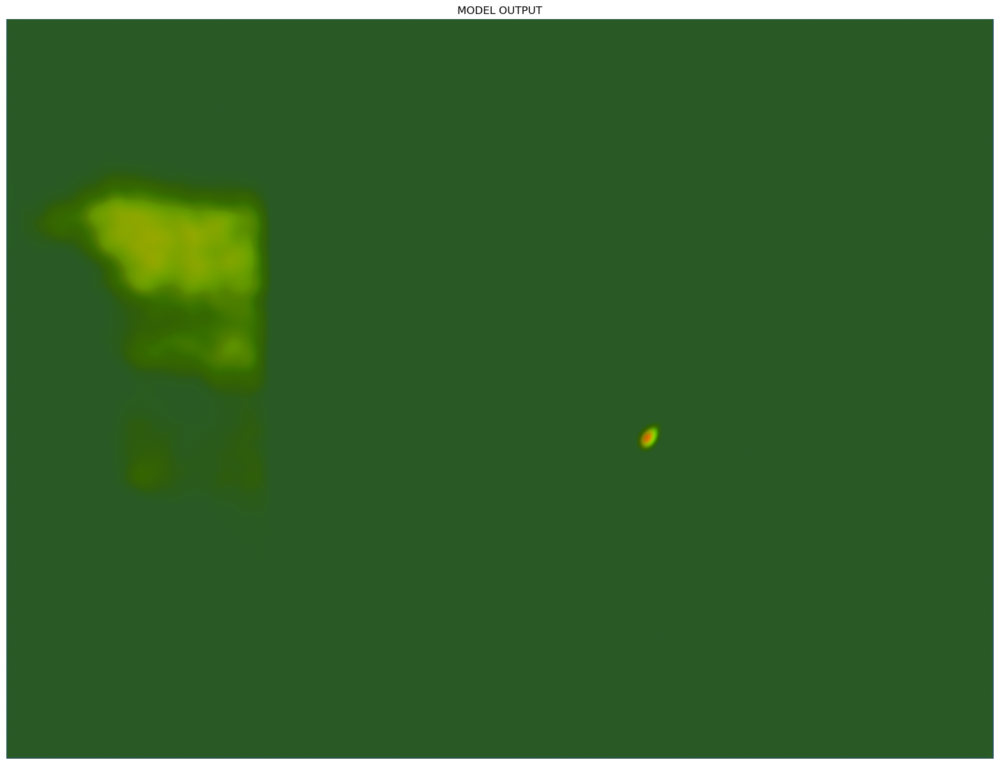

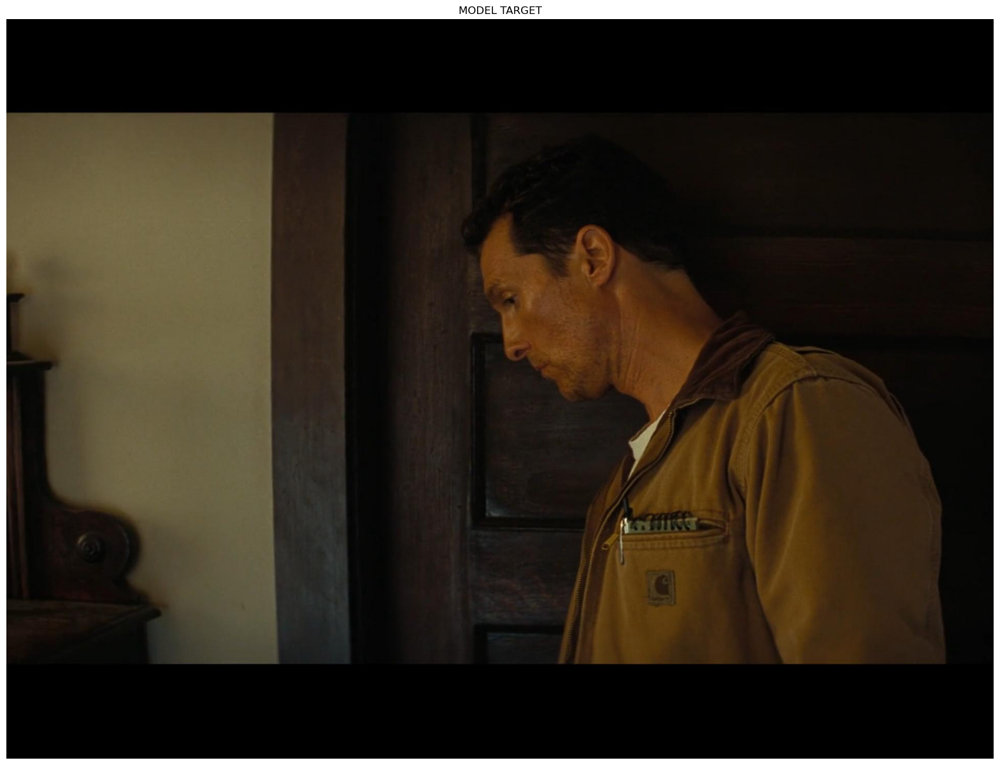

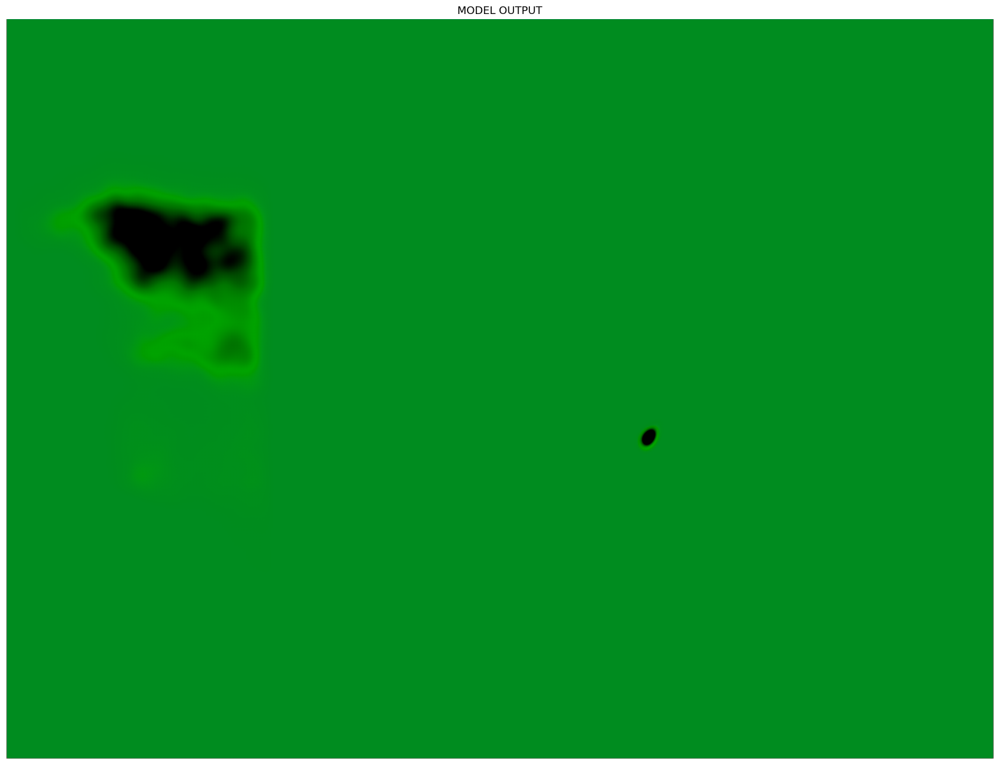

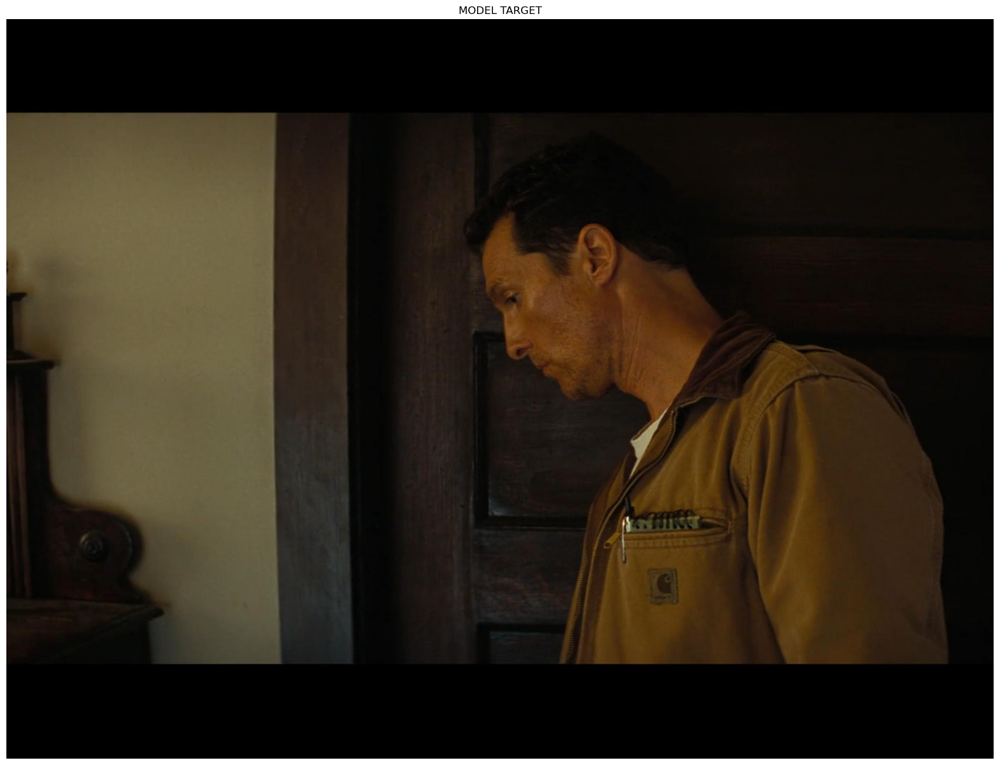

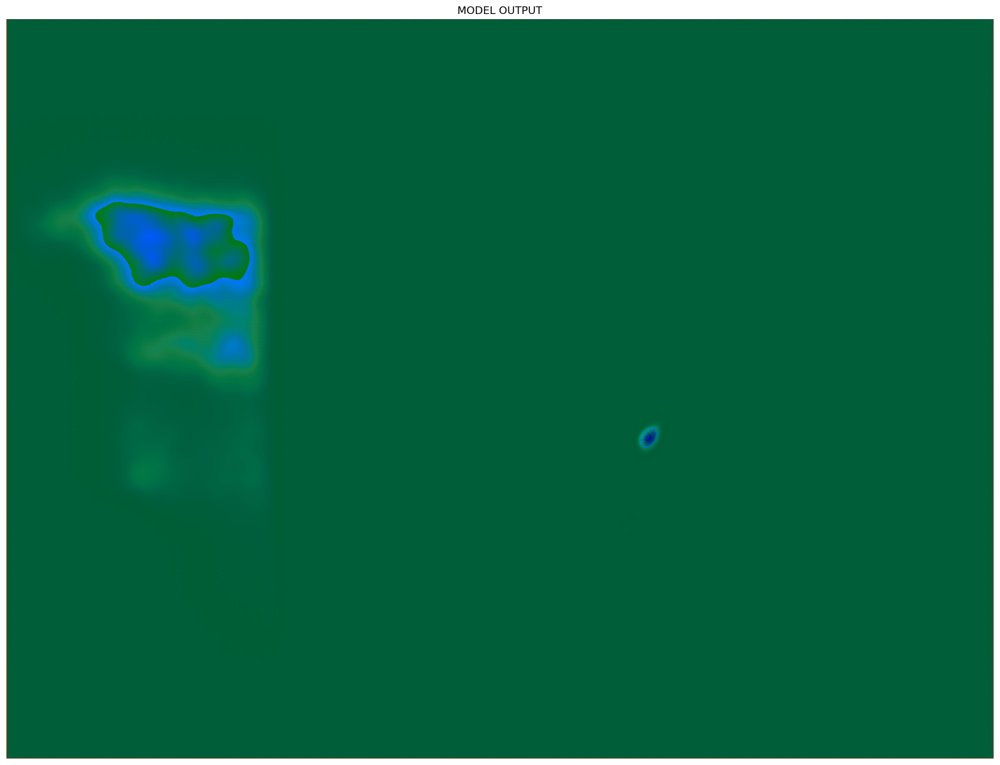

...

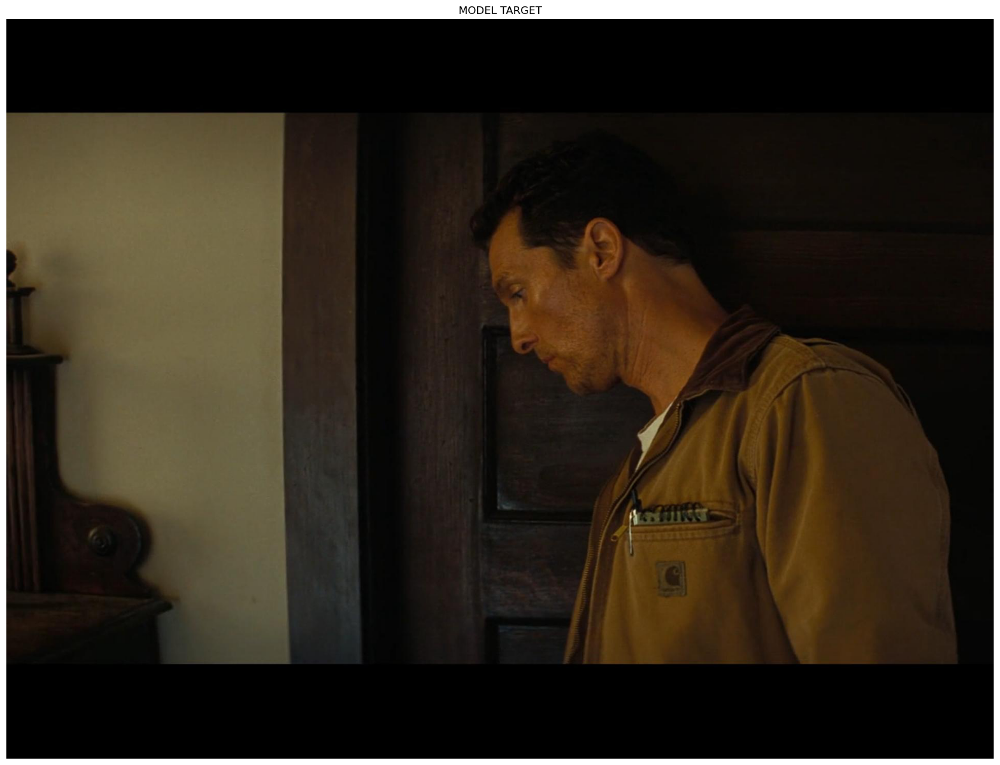

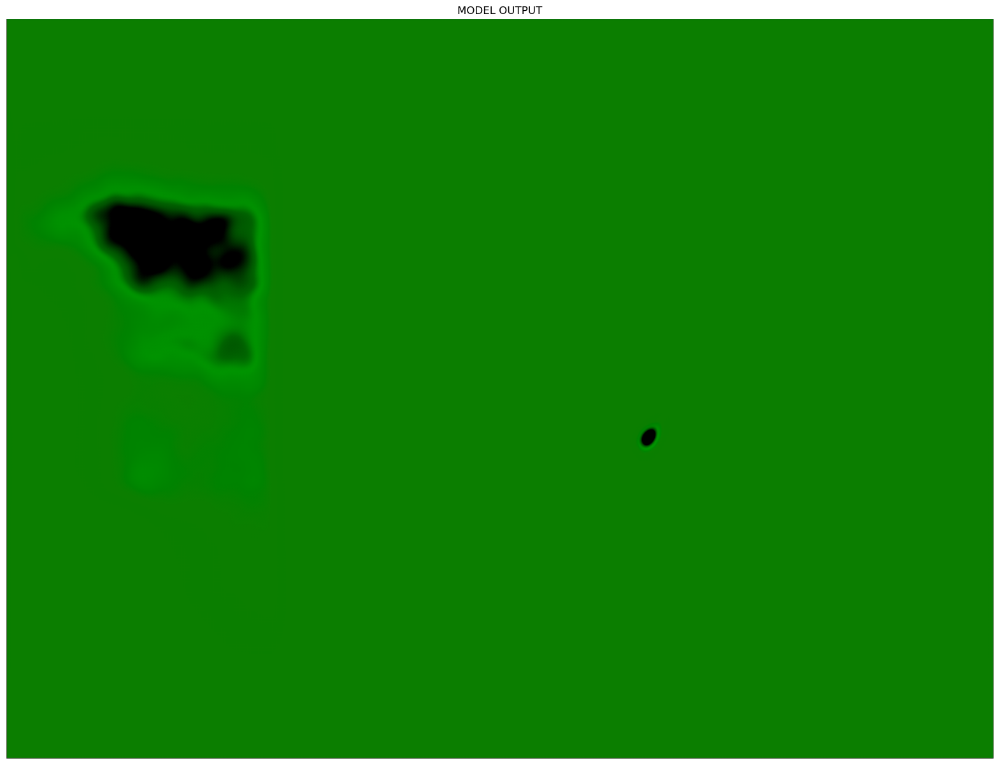

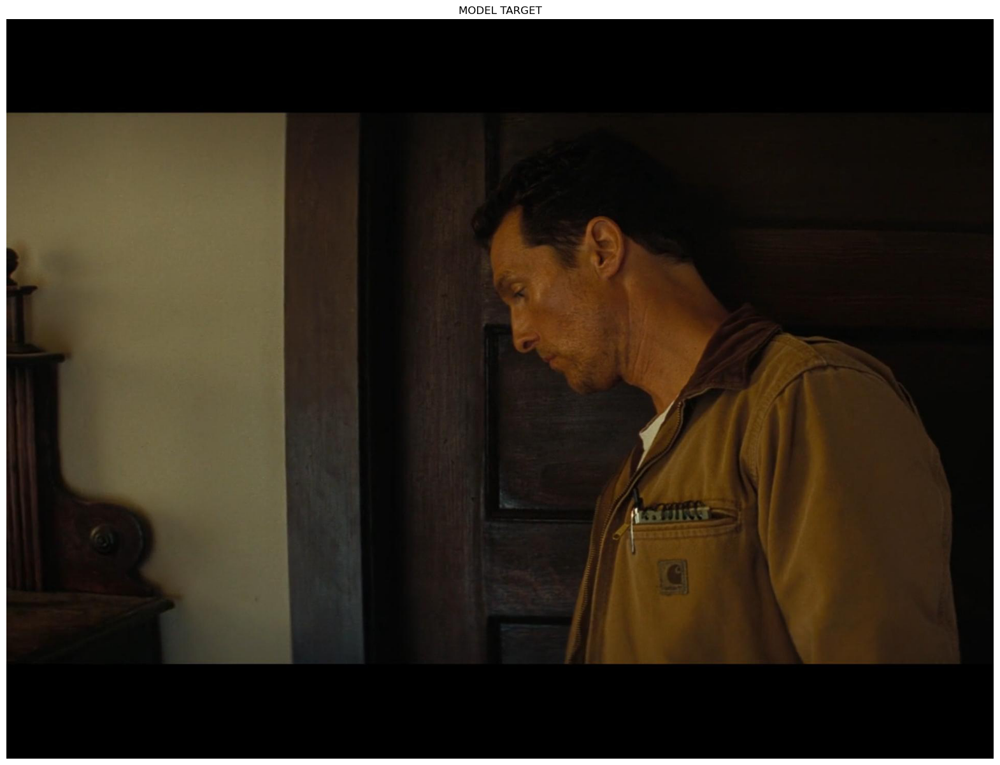

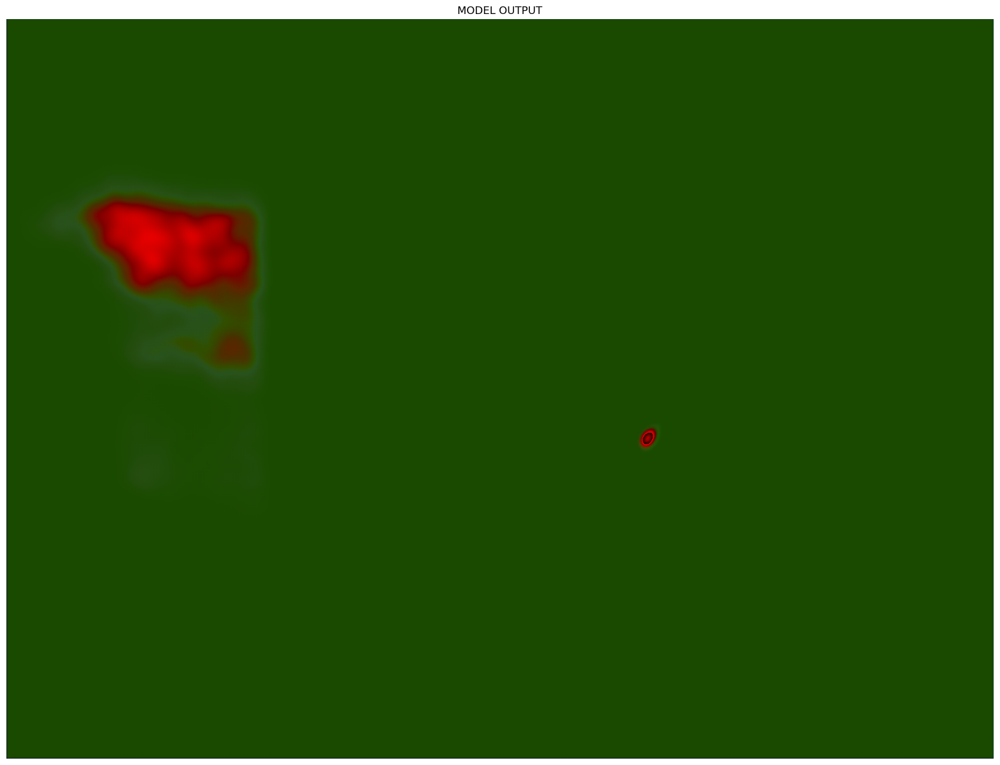

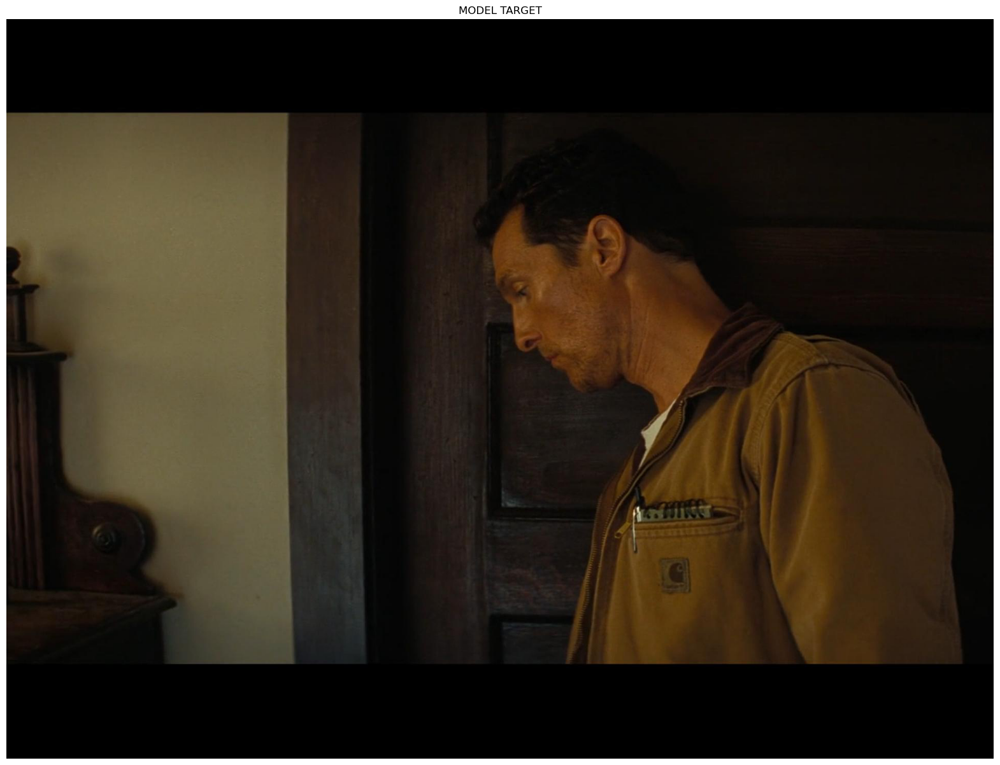

In [55]:
for i in range(len(results)):
    output_tensor = results[i][0]
    target_tensor = results[i][1]
    
    output_images = tensor_to_images(output_tensor)
    target_images = tensor_to_images(target_tensor)

    for j in range(STACK_SIZE):
        display_image(output_images[j], "MODEL OUTPUT")
        display_image(target_images[j], "MODEL TARGET")